# <font color=green>deepBreaks Applications</font>
## Modeling spectral tuning sites of opsin proteins based on amino-acid sequence...  

# <font color=red>Step 0: mySQL DB Setup -</font> Script 0
## *The following script sets up the schema for our vizphiz database.*
```

In [ ]:
#All neccessary packages to import for data process steps.
import mysql
import mysql.connector
#install mysql-connector-python // NOT mysql-connector
import re
import os
import datetime 
import subprocess
import shutil 

In [ ]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  password= "Geass5566!!")

mycursor = mydb.cursor()

try:
  mycursor.execute("""
  DROP DATABASE vizphiz_db;
  """)
  mydb.commit() 
except:
  "vizphiz_db does not yet exist!"
  pass

mycursor.execute("""
CREATE DATABASE vizphiz_db;
""")
mydb.commit() 

mycursor.execute("""
USE vizphiz_db;
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE lamdamax
(
id int unsigned not null primary key,
genus varchar(50),
species varchar(50),
celltype varchar(50),
cellsubtype varchar(50),
lamdamax decimal(9,5),
error decimal(9,5),
chromophore varchar(50),
method varchar(50),
stage varchar(50),
refid int,
notes varchar(1000)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE heterologous
(
hetid int unsigned not null primary key,
genus varchar(50),
species varchar(50),
accession varchar(500),
mutations varchar(500),
lamdamax decimal(9,5),
error decimal(9,5),
cellculture varchar(50),
purification varchar(50),
spectrum varchar(50),
sourcetype varchar(50),
refid int,
notes varchar(1000)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE links
(
linkid int unsigned not null primary key,
accession varchar(500),
maxid int,
refid int,
evidence varchar(1000)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE search
(
searchid int unsigned not null primary key,
researcher varchar(50),
month int,
year int,
engine varchar(500),
keywords varchar(500)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE opsins
(
opsinid int unsigned not null primary key,
genefamily varchar(50),
genenames varchar(50),
genus varchar(50),
phylum varchar(25),
species varchar(50),
db varchar(50),
accession varchar(500),
dna varchar(10000),
aa varchar(3333),
refid int
);
""")

mydb.commit()

mycursor.execute("""
CREATE TABLE refs
(
refid int,
doilink varchar(100),
searchid int
);
""")
mydb.commit()

mydb.close() 

# <font color=red>STEP 0: Data Base Setup -</font> Script 1 - Import heterologous.tsv into mySQL


In [ ]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database= "vizphiz",
  password= "Geass5566!!"
)

#read file for data
file1 = open('heterologous.tsv', 'r', encoding="utf8")
Lines = file1.readlines()

count=0
for line in Lines:
    columns = line.split("\t")
    print(columns)
    mycursor = mydb.cursor()

    sql = "INSERT INTO vizphiz_db.heterologous (hetid, genus, species, accession, mutations, lamdamax, error, cellculture, purification, spectrum, sourcetype, refid) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)"
    val = (columns[0], columns[1], columns[2], columns[3], columns[4], columns[5], columns[6], columns[7], columns[8], columns[9], columns[10], columns[12])
    print(sql)
    print(val)

    mycursor.execute(sql, val)

    mydb.commit()

    print(mycursor.rowcount, "record inserted.")

# <font color=red>STEP 0: Data Base Setup -</font> Script 2 - Import opsindb.tsv into mySQL

In [ ]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database= "vizphiz",
  password= "Geass5566!!"
)

#read file for data
file1 = open('opsindb.tsv', 'r')
Lines = file1.readlines()

count=0
for line in Lines:
    columns = line.split("\t")

    mycursor = mydb.cursor()

    sql = "INSERT INTO vizphiz_db.opsins (opsinid, genefamily, genenames, genus, species, db, accession, dna, aa, refid) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s)"
    val = (columns[0], columns[1], columns[2], columns[3], columns[4], columns[5], columns[6], columns[7], columns[8], columns[9])
    print(sql)
    print(val)

    mycursor.execute(sql, val)

    mydb.commit()

    print(mycursor.rowcount, "record inserted.")


# <font color=red>STEP 1: Extract Data From Vizphiz</font>
### Output = 8 different 'versions' // 'splits' of the data. 
2. Strategy = FFT-NS-2 // G-INS-1

In [ ]:
#All neccessary packages to import for data process steps.
import mysql
import mysql.connector
#install mysql-connector-python // NOT mysql-connector
import re
import os
import datetime 
import subprocess
import shutil 

In [ ]:
inv = re.compile('^Rtc|^BRh[0-3]|Pr[A-Z]|Rh1,Rh3|^IV|^inv')
rod = re.compile('Rh[0-2]|exoRh')
d = re.compile("^NM_001014890.2$|^NM_001014890$")
iec = re.compile("Limenitis|Papilio")

In [ ]:
#directory preperation
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seq_report_dir = str(f'vizphiz_data_splits_{dt_label}')
os.makedirs(seq_report_dir)

wd_output = f'{seq_report_dir}/wds.txt'
sws_output = f'{seq_report_dir}/swd.txt'
mws_output = f'{seq_report_dir}/mwd.txt'
rod_output = f'{seq_report_dir}/rod.txt'
wd_ni_output = f'{seq_report_dir}/wds_ni.txt'
inv_output = f'{seq_report_dir}/inv_only.txt'
nmoc_output = f'{seq_report_dir}/nmoc.txt'
mut_output = f'{seq_report_dir}/mut_only.txt'
wh_metadata = f'{seq_report_dir}/wds_meta.tsv'
sw_metadata = f'{seq_report_dir}/sws_meta.tsv'
mw_metadata = f'{seq_report_dir}/mws_meta.tsv'
rh_metadata = f'{seq_report_dir}/rod_meta.tsv'
wd_ni_metadata = f'{seq_report_dir}/wds_ni_meta.tsv'
inv_metadata = f'{seq_report_dir}/inv_meta.tsv'
nmoc_metadata = f'{seq_report_dir}/nmoc_meta.tsv'
mut_metadata = f'{seq_report_dir}/mut_meta.txt'

meta_data_list = [wh_metadata,sw_metadata,mw_metadata,rh_metadata,wd_ni_metadata,inv_metadata,nmoc_metadata]

m = 0
s = 0
l = 0
r = 0
c = 0
z = 0
q = 0
mut = 0


In [ ]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database="vizphiz",
  password="Geass5566!!"
) 
mycursor = mydb.cursor()

sql = "select DISTINCT o.genus,o.species,o.genefamily,o.accession,h.lamdamax,o.aa,o.phylum from opsins.opsins o, opsins.heterologous h WHERE (o.accession = h.accession AND o.refid = h.refid); "
mycursor.execute(sql)
myresult = mycursor.fetchall()


for x in myresult:  

  if (x[4] == 0):
    pass   
  else:  
  #REG-DATA SECTION    
    with open(wd_output, 'a') as f:
      if m == 0:
        f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
      if (d.match(x[3])):
        pass
      else:
        m += 1 
        #This makes the fasta format file
        seq = ">S" + str(m)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(wd_ni_output, 'a') as f:
      p = re.compile('^Rtc|^BRh[0-3]|Pr[A-Z]|Rh1,Rh3|^IV|^inv')
      if (p.match(x[2]) or d.match(x[3]) or iec.match(x[0])):
        pass
      else:
        if c == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        c += 1 
        #This makes the fasta format file
        seq = ">S" + str(c)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(inv_output, 'a') as f:
      p = re.compile('^Rtc|^BRh[0-3]|Pr[A-Z]|Rh1,Rh3|^IV|^inv')
      if (p.match(x[2]) or iec.match(x[0])):
        if q == 0:
          f.write(">Squid\nMGRDLRDNETWWYNPSIVVHPHWREFDQVPDAVYYSLGIFIGICGIIGCGGNGIVIYLFTKTKSLQTPANMFIINLAFSDFTFSLVNGFPLMTISCFLKKWIFGFAACKVYGFIGGIFGFMSIMTMAMISIDRYNVIGRPMAASKKMSHRRAFIMIIFVWLWSVLWAIGPIFGWGAYTLEGVLCNCSFDYISRDSTTRSNILCMFILGFFGPILIIFFCYFNIVMSVSNHEKEMAAMAKRLNAKELRKAQAGANAEMRLAKISIVIVSQFLLSWSPYAVVALLAQFGPLEWVTPYAAQLPVMFAKASAIHNPMIYSVSHPKFREAISQTFPWVLTCCQFDDKETEDDKDAETEIPAGESSDAAPSADAAQMKEMMAMMQKMQQQQAAYPPQGYAPPPQGYPPQGYPPQGYPPQGYPPQGYPPPPQGAPPQGAPPAAPPQGVDNQAYQA\n")
        q += 1 
        #This makes the fasta format file
        seq = ">S" + str(q)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)
      else:
        pass

    with open(nmoc_output, 'a') as f:
      p = re.compile('[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3]):
        pass
      else:
        if z == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        if(d.match(x[3])):
          pass
        else:
          z += 1 
          #This makes the fasta format file
          seq = ">S" + str(z)
          f.write(seq)
          seq2 = str('\n' + x[5] + '\n')
          f.write(seq2)

    with open(mut_output, 'a') as f:
      p = re.compile('[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3]):
        if mut == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        if(d.match(x[3])):
          pass
        else:
          mut += 1 
          #This makes the fasta format file
          seq = ">M" + str(mut)
          f.write(seq)
          seq2 = str('\n' + x[5] + '\n')
          f.write(seq2)
      else:
        pass

    with open(sws_output, 'a') as f:
      p = re.compile('^SWS|^UVS')
      if p.match(x[2]):
        s+=1
        if s == 1:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")  
      #This makes the fasta format file
        seq = ">S" + str(s)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(mws_output, 'a') as f:
      p = re.compile('^MWS|^LWS')
      if p.match(x[2]):
        l+=1
        if l == 1:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        #This makes the fasta format file
        seq = ">S" + str(l)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(rod_output, 'a') as f:
      p = re.compile('Rh[0-2]|exoRh')
      if p.match(x[2]):
        if r == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        if (inv.match(x[2]) or d.match(x[3]) or iec.match(x[0])):
          pass
        else:
          r+=1
          #This makes the fasta format file
          seq = ">S" + str(r)
          f.write(seq)
          seq2 = str('\n' + x[5] + '\n')
          f.write(seq2)

  #METADATA SECTION
    with open(wh_metadata, 'a') as g:
      if m == 1:
        g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
        g.write("Bovine\t500.0000\tBos_tarus\tRh1\tNM_001014890\n")
      if (d.match(x[3])):
        pass
      else:        
        md =  str("S" + str(m) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(wd_ni_metadata, 'a') as g:
      p = re.compile('^Rtc|^BRh[0-3]|Pr[A-Z]|Rh1,Rh3|^IV|^inv')
      if (p.match(x[2]) or d.match(x[3]) or iec.match(x[0])):
        pass
      else:
        if c == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Bovine\t500.0000\tBos_tarus\tRh1\tNM_001014890\n")

        md =  str("S" + str(c) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(inv_metadata, 'a') as g:
      p = re.compile('^Rtc|^BRh[0-3]|Pr[A-Z]|Rh1,Rh3|^IV|^inv')
      if (p.match(x[2]) or iec.match(x[0])):
        if q == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Squid\t473.0000\tTodarodes_pacificus\tRh1\tX70498\n")

        md =  str("S" + str(q) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)
      else:
        pass
          
    with open(sw_metadata, 'a') as g:
    #This makes the metadata formatted for a linear regression model.
      p = re.compile('^SWS|^UVS')
      if p.match(x[2]):
        if s == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")  
        md =  str("S" + str(s) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(mw_metadata, 'a') as g:
      #This makes the metadata formatted for a linear regression model.
      p = re.compile('^MWS|^LWS')
      if p.match(x[2]):
        if l == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")  
        md =  str("S" + str(l) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(rh_metadata, 'a') as g:
      #This makes the metadata formatted for a linear regression model.
      p = re.compile('Rh[0-3]|exoRh')

      if p.match(x[2]):
        if r == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")
        if (inv.match(x[2]) or d.match(x[3]) or iec.match(x[0])):
          pass
        else:  
          md =  str("S" + str(r) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
          g.write(md)

    with open(nmoc_metadata, 'a') as g:
      p = re.compile('[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3]):
        pass
      else:
        if z == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")
        if(d.match(x[3])):
          pass
        else:        
          md =  str("S" + str(z) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
          g.write(md)

    with open(mut_metadata, 'a') as g:
      p = re.compile('[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3]):
        if mut == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")
        if(d.match(x[3])):
          pass
        else:        
          md =  str("M" + str(mut) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
          g.write(md)
      else:
        pass

In [ ]:
msp_erg_raw = open('./msp_test_data/msp_erg_raw.txt').readlines()
for lines in msp_erg_raw:
  with open(wd_output, 'a') as f:
    f.write(lines)
  with open(wd_ni_output, 'a') as f:
    f.write(lines)
  with open(rod_output, 'a') as f:
    f.write(lines)
  with open(nmoc_output, 'a') as f:
    f.write(lines)
  with open(inv_output, 'a') as f:
    f.write(lines)
  with open(mws_output, 'a') as f:
    f.write(lines)
  with open(sws_output, 'a') as f:
    f.write(lines)


In [ ]:
mut_only = open(mut_output).readlines()
mut_nmoc = f'{seq_report_dir}/nmoc_mut_added.txt'
shutil.copy(nmoc_output , mut_nmoc)
x = 0
for lines in mut_only:
  if x <= 1:
    if x == 0:
      with open(mut_nmoc, 'a') as m:
        m.write('\n')
    else:
      pass
    x+=1
  else:
    with open(mut_nmoc, 'a') as m:
      m.write(lines)

# <font color=red>STEP 2: Align Raw Data and Format for 'deepBreaks'</font>
## REMINDER - You will need to change the directory for the 'mafft_exe' variable to the one of your own operating system!


In [ ]:
from Bio.Align.Applications import MafftCommandline
from Bio import AlignIO

data_split_list = [wd_output,sws_output,mws_output,rod_output,wd_ni_output,inv_output,nmoc_output,mut_nmoc,mut_output]
output_list = []
mafft_exe = 'C:/Users/safra/mafft-win/mafft.bat' 

for data in data_split_list:
    output = f'{data.split(".")[0]}_aligned.txt'
    mafft_cline = MafftCommandline(mafft_exe, input=f'./{data}')
    #print(mafft_cline)
    stdout, stderr = mafft_cline()

    with open(output, "w") as handle:
        handle.write(stdout)
        #print(handle)
    align = AlignIO.read(output, "fasta")
    output_list.append(f'{output}')


In [ ]:
print(output_list)

for item in output_list:
    output = item.split('.')[0]
    print(output)

In [ ]:
#enter list of aligned text files here.
inputs = output_list
deep_breaks_input_data = []
# inputs = ['wds_aligned.txt','wds_ni_aligned.txt','rod_aligned.txt','nmoc_aligned.txt']
##enter list of names for desired formatted fasta files here.
# output = ['wds_fmt.fasta','wds_ni_fmt.fasta','rod_fmt.fasta','nmoc_fmt.fasta']
i=0
k = 0
for item in inputs:
    print(item)
    lines = open(inputs[i]).readlines()
    output = f'./{inputs[i].split(".")[0]}_db_fmt.fasta'
    deep_breaks_input_data.append(output)
    print(output)
    file = open(output, 'w')
    m=0
    for line in lines:
        snip = str(lines[k])
        if '>' in snip:
            if m == 0:
                m+=1
            else:
                file.write("\n")
            file.write(snip)
        else:
            entry = ""
            entry = str(snip.replace("\n",""))
            file.write(entry)
        k+=1
    k = 0
    i+=1
    file.close()

In [ ]:
print(deep_breaks_input_data)

# <font color=red>STEP 3: deepBreaks</font>
## THIS IS A LONG SECTION! 
### STEP 4 doesn't start until Cell 34

In [3]:
# importing deepBreaks libraries 
from deepBreaks.utils import get_models, get_scores, get_params, make_pipeline
from deepBreaks.preprocessing import MisCare, ConstantCare, URareCare, CustomOneHotEncoder
from deepBreaks.preprocessing import FeatureSelection, CollinearCare
from deepBreaks.preprocessing import read_data
from deepBreaks.models import model_compare_cv, finalize_top, importance_from_pipe, mean_importance, summarize_results
from deepBreaks.visualization import plot_scatter, dp_plot, plot_imp_model, plot_imp_all
from deepBreaks.preprocessing import write_fasta
import warnings
import datetime
import os
import shutil 

In [4]:
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')

In [5]:
# defining user params, file pathes, analysis type

# path to sequences
seqFileName = './vizphiz_data_splits_2023-08-09_16-39-38/nmoc_mut_added_aligned_db_fmt.fasta' 
#find way to automatically save aligned file to report directory and then have unaligned sequence align to file via mafft wapper and thennn run the hot-encode step to query model on correctly formatted seq.
# path to metadata
metaDataFileName = './vizphiz_data_splits_2023-08-09_16-39-38/nmoc_meta.tsv' 

# name of the phenotype
mt = 'Lambda_Max'

# type of the sequences
seq_type = 'aa'

# type of the analysis if it is a classification model, then we put cl instead of reg
ana_type = 'reg' 


In [6]:
# making a unique directory for saving the reports of the analysis
print('direcory preparation')
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seqFile = seqFileName.split('/')[2]
#print(seqFile)
seqFile = seqFile.split('.')[0]
#print(seqFile)
report_dir = str(seqFile +'_' + mt + '_' + dt_label)
os.makedirs(report_dir)

direcory preparation


In [61]:
%%time
print('reading meta-data')
# importing metadata
meta_data = read_data(metaDataFileName, seq_type = None, is_main=False)
metaFile = metaDataFileName.split('/')[1]
# importing sequences data
print('reading fasta file')
#creating a copy of the input fasta file and metadata file into the report directory
shutil.copy2(f'{seqFileName}' , report_dir)
shutil.copy2(f'{metaDataFileName}' , report_dir)
tr = read_data(seqFileName, seq_type = seq_type, is_main=True, gap_threshold=0.6)
msp = tr.copy()
#converting the pandas df which contains all sequences after the gap_threshold has cleaned all the excess gaps
write_fasta(dat = tr, fasta_file = f'{seqFile}_gap_dropped.fasta' , report_dir = report_dir) 


reading meta-data
reading fasta file
nmoc_mut_added_aligned_db_fmt_gap_dropped.fasta was saved successfully
CPU times: total: 391 ms
Wall time: 395 ms


In [62]:
tr = tr.merge(meta_data.loc[:, mt],  left_index=True, right_index=True)
tr.shape

(314, 356)

In [63]:
tr.head()

,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p347,p348,p349,p350,p351,p352,p353,p354,p355,Lambda_Max
Bovine,M,N,G,T,E,G,P,N,F,Y,...,NaN,NaN,T,S,Q,V,A,P,A,500.0
S1,M,N,G,T,E,G,P,Y,F,Y,...,A,NaN,NaN,S,S,V,S,P,A,502.0
S2,NaN,NaN,NaN,T,E,G,P,Y,F,Y,...,A,NaN,NaN,S,S,V,S,P,A,502.0
S3,NaN,NaN,NaN,T,E,G,P,D,F,Y,...,A,NaN,NaN,S,S,V,S,P,A,481.0
S4,NaN,NaN,NaN,T,E,G,P,F,F,Y,...,A,NaN,NaN,S,S,V,S,P,A,494.0


In [64]:
sv_msp = tr.shape[0]
print(sv_msp)

314


In [65]:
mut = msp.iloc[sv_msp+35:].copy()
mut.head()

,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p346,p347,p348,p349,p350,p351,p352,p353,p354,p355
M1,M,N,G,T,E,G,Q,D,F,Y,...,S,V,S,T,S,Q,V,S,P,A
M2,M,N,G,T,E,G,Q,D,F,Y,...,S,V,S,T,S,Q,V,S,P,A
M3,M,N,G,T,E,G,Q,D,F,Y,...,S,V,S,T,S,Q,V,S,P,A
M4,M,N,G,T,E,G,P,N,F,Y,...,NaN,NaN,NaN,T,S,Q,V,A,P,A
M5,M,N,G,T,E,G,P,N,F,Y,...,NaN,NaN,NaN,T,S,Q,V,A,P,A


In [66]:
msp = msp.iloc[sv_msp:sv_msp+35].copy()
msp.head()

,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p346,p347,p348,p349,p350,p351,p352,p353,p354,p355
Neogonodactylus_oerstedii|334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Neogonodactylus_oerstedii|383,NaN,NaN,NaN,NaN,D,W,E,N,V,G,...,NaN,NaN,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bombus_impatiens|539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,D,NaN,N,E,K,S,N,A,NaN,NaN
Bombus_impatiens|424,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,T,E,K,I,K,S,D,D
Bombus_impatiens|347,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,P,A,A,S,S,NaN,NaN,NaN


In [67]:
msp.shape

(35, 355)

In [14]:
#msp_meta_data = read_data('./msp_test_data/erg_msp_meta.tsv', seq_type = None, is_main=False)
#msp.merge(msp_meta_data.loc[:, mt],  left_index=True, right_index=True)
#msp.shape

In [15]:
import numpy as np
import csv
import pandas as pd

In [16]:
#if tr.shape[0] <= 150:
    #sample_n = 15
#elif tr.shape[0] > 150 and tr.shape[0] <= 300:
    #sample_n = 25
#elif tr.shape[0] > 300 and tr.shape[0] <= 1000:
    #sample_n = 50
#else:
    #sample = 100

In [17]:
#n = 0
#while n < 1:
    #drop_indices = np.random.choice(tr.index, sample_n, replace=False)
    #print(drop_indices)
    #drop_indices = np.append(drop_indices,['Bovine'])
    #print(drop_indices)
    #if 'Bovine' in drop_indices:
        #pass
    #elif 'Squid' in drop_indices:
        #pass
    #else:
        #
#n+=1

In [18]:
#unseen = tr.loc[drop_indices].copy()
#umd = unseen.loc[:, mt].values

#unseen.drop(mt, axis=1, inplace=True)
#tr = tr.drop(drop_indices)


In [19]:
#base_test = meta_data.loc[drop_indices].copy()
#base_test.head()

In [20]:
y = tr.loc[:, mt].values
tr.drop(mt, axis=1, inplace=True)
print('Shape of data is: ', tr.shape)

Shape of data is:  (314, 355)


In [21]:
try:
    reference_seq = tr.loc['Bovine'].copy()
    ref_seq_name = 'bovine'
    #print(bovine)
except:
    reference_seq = tr.loc['Squid'].copy()
    ref_seq_name = 'squid'
    #print(squid)
reference_seq.to_csv(path_or_buf= f'{report_dir}/ref_sequence.csv',index = True,mode="w")

In [22]:
#unseen.head()

**Attention**: metadata and sequences data should have the names as their row names and for each sequence their must be a value in the meta data file.

In [23]:
print('metadata looks like this:')
meta_data.head()

metadata looks like this:


,Lambda_Max,Species,Opsin_Family,Accession
Bovine,500.0,Bos_taurus,Rh1,NM_001014890
S1,502.0,Neoniphon_sammara,Rh1,U57536.1
S2,502.0,Neoniphon_argenteus,Rh1,U57540.1
S3,481.0,Neoniphon_aurolineatus,Rh1,U57541.1
S4,494.0,Sargocentron_punctatissimum,Rh1,U57543.1


In [24]:
print('sequence data looks like this:')
tr.head()

sequence data looks like this:


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p346,p347,p348,p349,p350,p351,p352,p353,p354,p355
Bovine,M,N,G,T,E,G,P,N,F,Y,...,NaN,NaN,NaN,T,S,Q,V,A,P,A
S1,M,N,G,T,E,G,P,Y,F,Y,...,S,A,NaN,NaN,S,S,V,S,P,A
S2,NaN,NaN,NaN,T,E,G,P,Y,F,Y,...,S,A,NaN,NaN,S,S,V,S,P,A
S3,NaN,NaN,NaN,T,E,G,P,D,F,Y,...,S,A,NaN,NaN,S,S,V,S,P,A
S4,NaN,NaN,NaN,T,E,G,P,F,F,Y,...,S,A,NaN,NaN,S,S,V,S,P,A


### Preprocessing
In this step, we do all these steps:
1. dropping columns with a number of missing values above a certain threshold  
2. dropping zero entropy columns  
3. imputing missing values with the mode of that column  
4. replacing cases with a frequency below a threshold (default 1.5%) with the mode of that column
5. dropping zero entropy columns
6. use statistical tests (each position against the phenotype) and drop columns with p-values below a threshold (default 0.25)
7. one-hot encode the remaining columns
8. calculate the pair-wise distance matrix for all of the columns
9. use the distance matrix for DBSCAN and cluster the correlated positions together
10. keep only one column (closes to center of each cluster) for each group and drop the rest from the training data set

In [25]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.025)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.10, keep=False)),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.05, keep=False))
    ])

In [26]:
%%time
report, top = model_compare_cv(X=tr, y=y, preprocess_pipe=prep_pipeline,
                               models_dict=get_models(ana_type=ana_type),
                               scoring=get_scores(ana_type=ana_type),
                               report_dir=report_dir,
                               cv=12, ana_type=ana_type, cache_dir=report_dir)

Fitting rf...
Fitting Adaboost...
Fitting et...
Fitting gbc...
Fitting dt...
Fitting lr...
Fitting Lasso...
Fitting LassoLars...
Fitting BayesianRidge...
Fitting HubR...
Fitting lgbm...
Fitting xgb...
CPU times: total: 4.98 s
Wall time: 53.8 s


MAE = Mean Absolute Error

MSE = Mean Squared Error

RMSE = Rooted Mean Square Error

MAPE = Mean Absolute % Error - the average magnitude of error produced by a model, or how far off predictions are on average. A MAPE value of 20% means that the average absolute percentage difference between the predictions and the actuals is 20%

In [27]:
report

,R2,MAE,MSE,RMSE,MAPE
BayesianRidge,9.178957e-01,9.635426e+00,2.696460e+02,1.529343e+01,2.072638e-02
xgb,9.072695e-01,8.681806e+00,3.068724e+02,1.581212e+01,1.878585e-02
HubR,8.935900e-01,1.113431e+01,3.591218e+02,1.759989e+01,2.361588e-02
gbc,8.924783e-01,9.921154e+00,3.650943e+02,1.692760e+01,2.159642e-02
lgbm,8.915819e-01,9.937315e+00,3.599590e+02,1.680354e+01,2.183569e-02
rf,8.887812e-01,9.821701e+00,3.745264e+02,1.725016e+01,2.152521e-02
LassoLars,8.641798e-01,1.345204e+01,4.241621e+02,1.941410e+01,2.959702e-02
Lasso,8.641681e-01,1.345289e+01,4.241879e+02,1.941495e+01,2.959897e-02
dt,8.634388e-01,1.014798e+01,4.646999e+02,1.933147e+01,2.211947e-02
Adaboost,8.536523e-01,1.405279e+01,4.638362e+02,2.031505e+01,3.063023e-02


In [28]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.025)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.10, keep=True)),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.05, keep=True))
    ])

In [29]:
modified_top = []
mtml = []
for model in top:
    modified_top.append(make_pipeline(steps=[('prep', prep_pipeline), model.steps[-1]]))
    my_top_models = str(model[1:])
    #print(my_top_models)
    my_top_models = my_top_models.split("'")[3]
    mtml.append(my_top_models)
    #print(my_top_models)

In [30]:
modified_top[0]

Pipeline(steps=[('prep',
                 Pipeline(steps=[('mc', MisCare(missing_threshold=0.05)),
                                 ('cc', ConstantCare()),
                                 ('ur', URareCare(threshold=0.025)),
                                 ('cc2', ConstantCare()),
                                 ('one_hot', CustomOneHotEncoder()),
                                 ('feature_selection',
                                  FeatureSelection(alpha=0.1, keep=True,
                                                   model_type='reg')),
                                 ('collinear_care',
                                  CollinearCare(dist_method='correlation',
                                                keep=True, threshold=0.05))])),
                ('BayesianRidge', BayesianRidge())])

In [31]:
%%time
top = finalize_top(X=tr, y=y, top_models=modified_top, grid_param=get_params(),report_dir=report_dir, cv=10)


Tuning BayesianRidge...
Tuning xgb...
Tuning HubR...
CPU times: total: 17 s
Wall time: 7.04 s


In [32]:
%%time
sr = summarize_results(top_models=top, report_dir=report_dir)

CPU times: total: 797 ms
Wall time: 808 ms


In [33]:
sr.head()

,feature,p_value,score,BayesianRidge,xgb,HubR,mean
0,p1_GAP,4.349282e-01,0.611203,0.000000,0.000000,0.000000,0.000000
1,p1_L,2.956744e-07,27.461623,0.170460,0.000137,0.224227,0.131608
2,p1_M,2.029000e-12,53.682684,0.131441,0.000007,0.001819,0.044422
3,p1_P,6.881493e-02,3.334058,0.000000,0.000000,0.000000,0.000000
4,p2_DTLMQGPHWY,4.299040e-09,36.522400,0.789136,0.000127,0.502960,0.430741


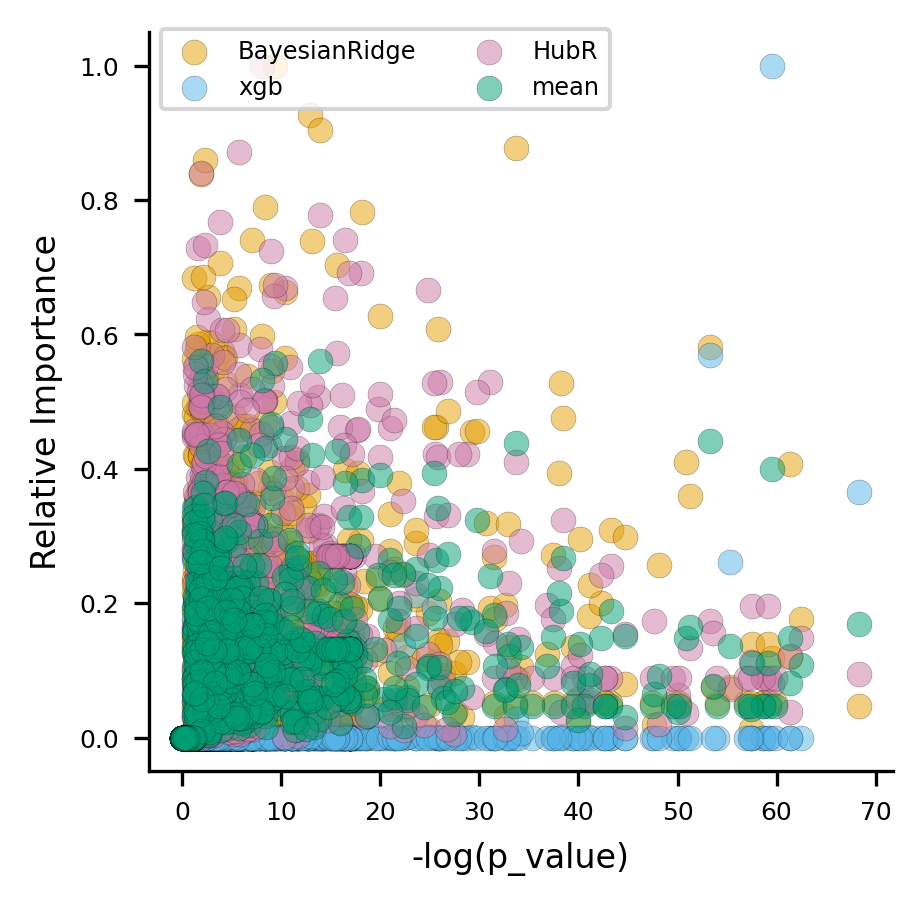

In [34]:
scatter_plot = plot_scatter(summary_result=sr, report_dir=report_dir)

In [35]:
%%time
mean_imp = mean_importance(top, report_dir=report_dir)

CPU times: total: 109 ms
Wall time: 114 ms


mean Done


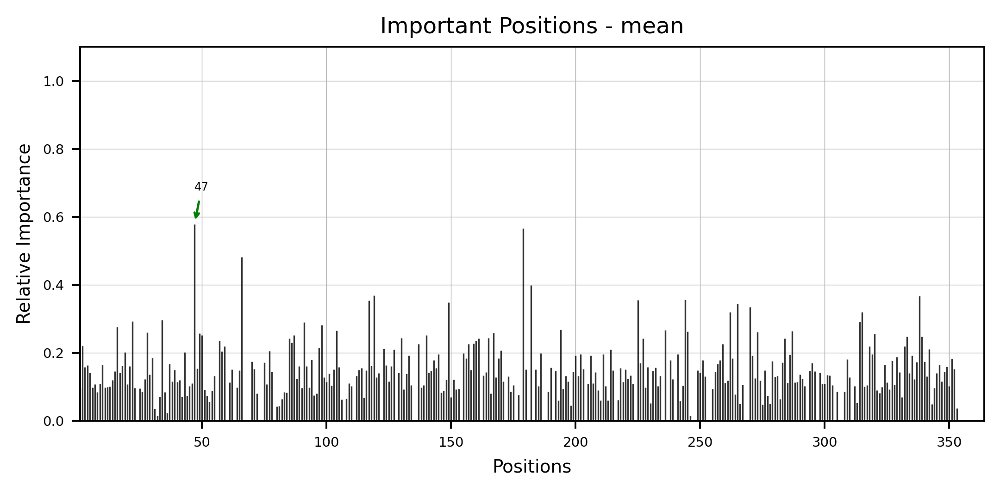

In [36]:
dp_plot(importance=mean_imp,imp_col='mean', model_name='mean', report_dir=report_dir)

In [37]:
tr = prep_pipeline[:4].fit_transform(tr)

BayesianRidge Done
BayesianRidge  Done
xgb Done
xgb  Done
HubR Done
HubR  Done


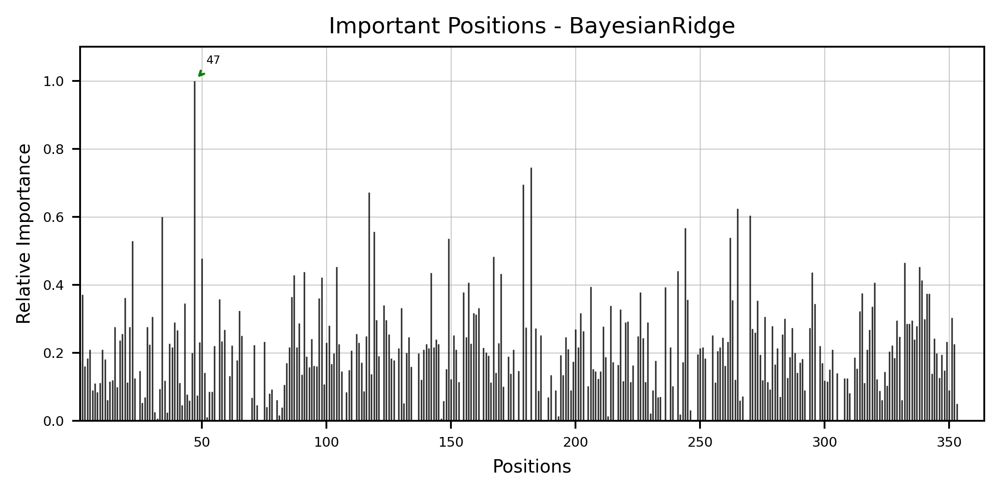

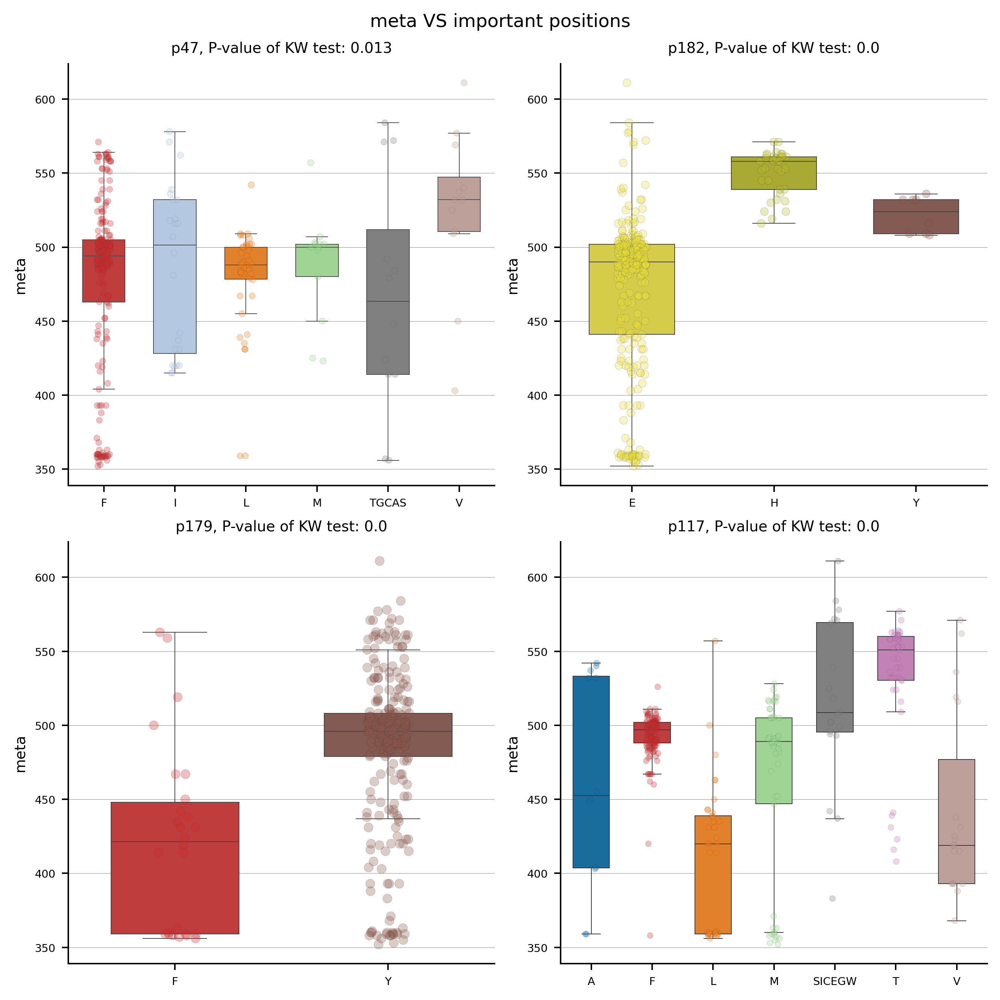

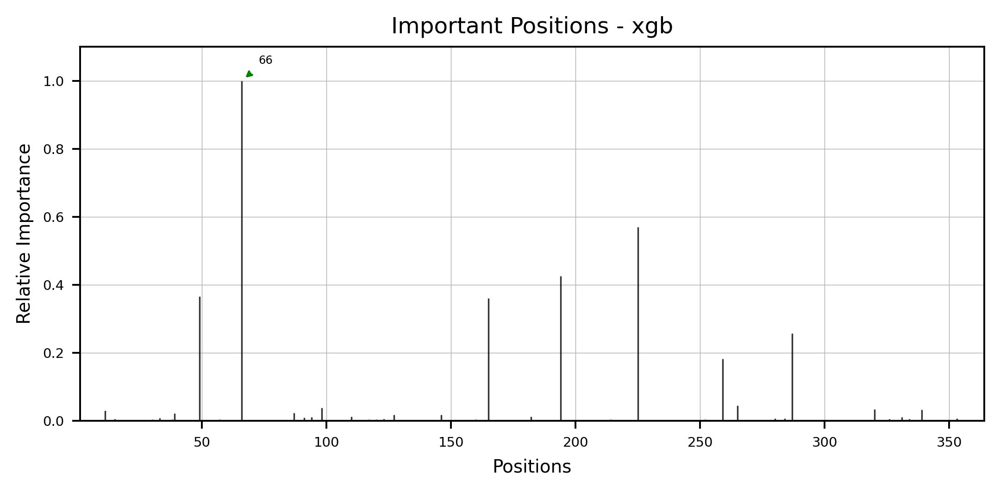

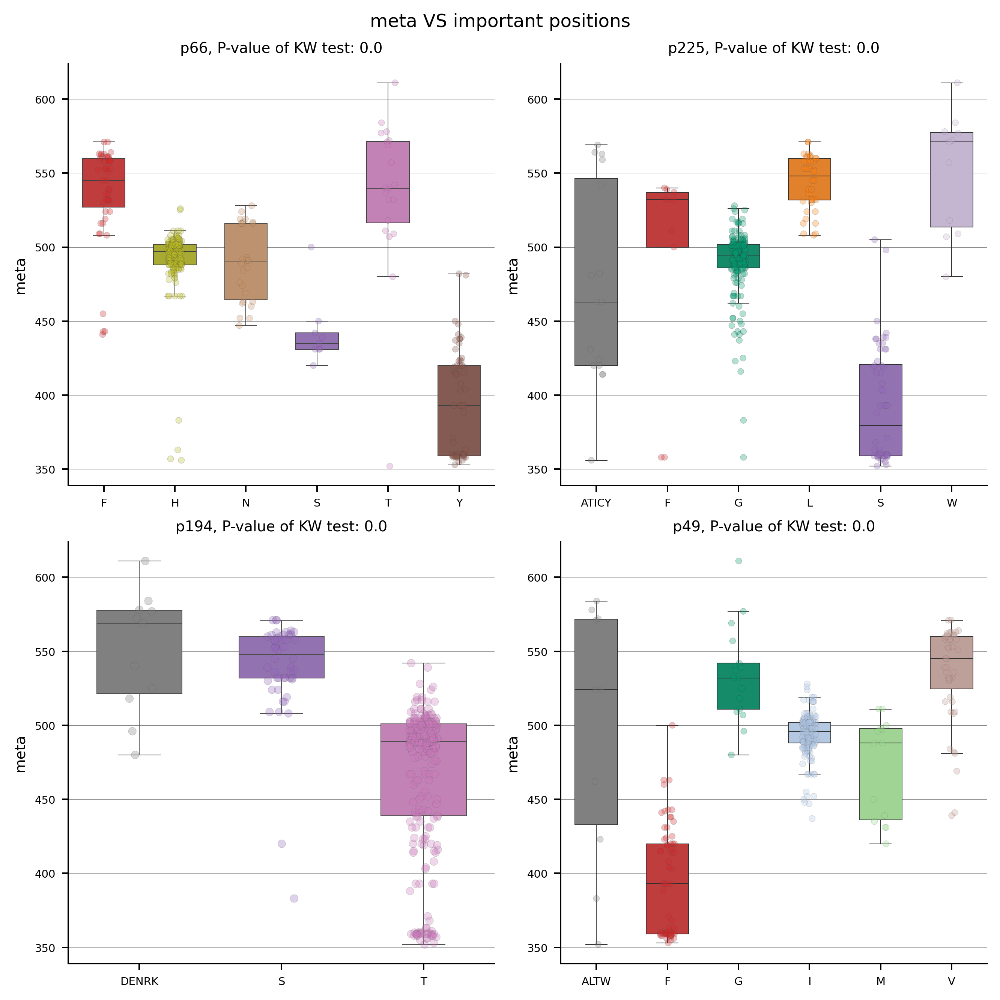

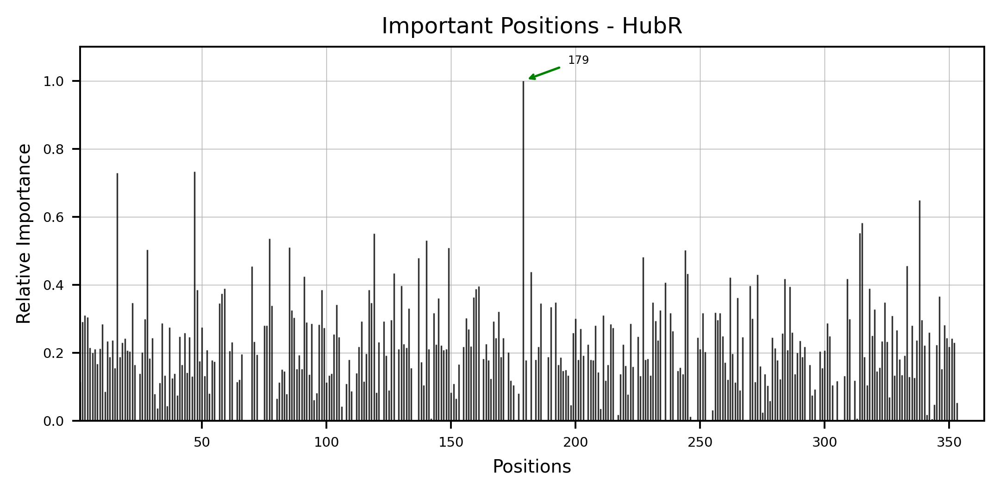

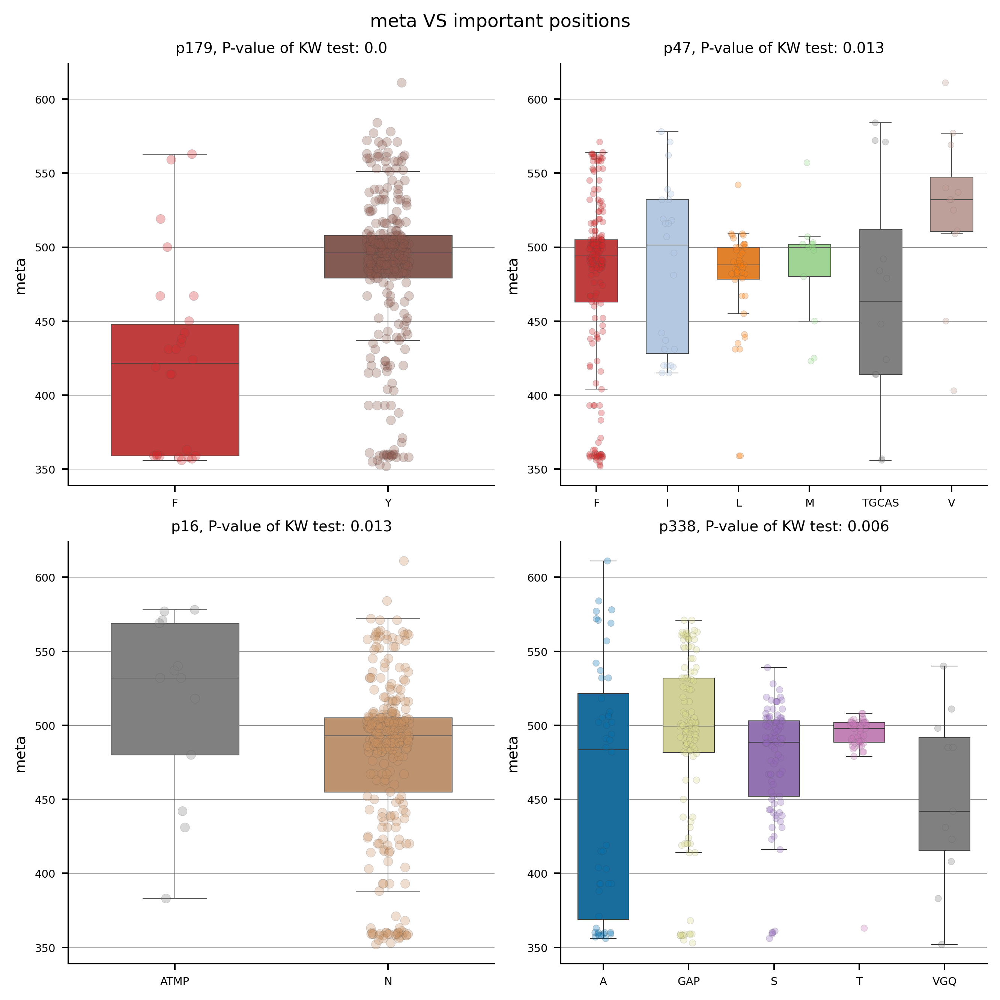

In [38]:
for model in top:
    model_name = model.steps[-1][0]
    dp_plot(importance=importance_from_pipe(model),
            imp_col='standard_value',
            model_name = model_name, report_dir=report_dir)
    
    plot_imp_model(importance=importance_from_pipe(model), 
               X_train=tr, y_train=y, model_name=model_name,
                   meta_var='meta', model_type=ana_type, report_dir=report_dir)

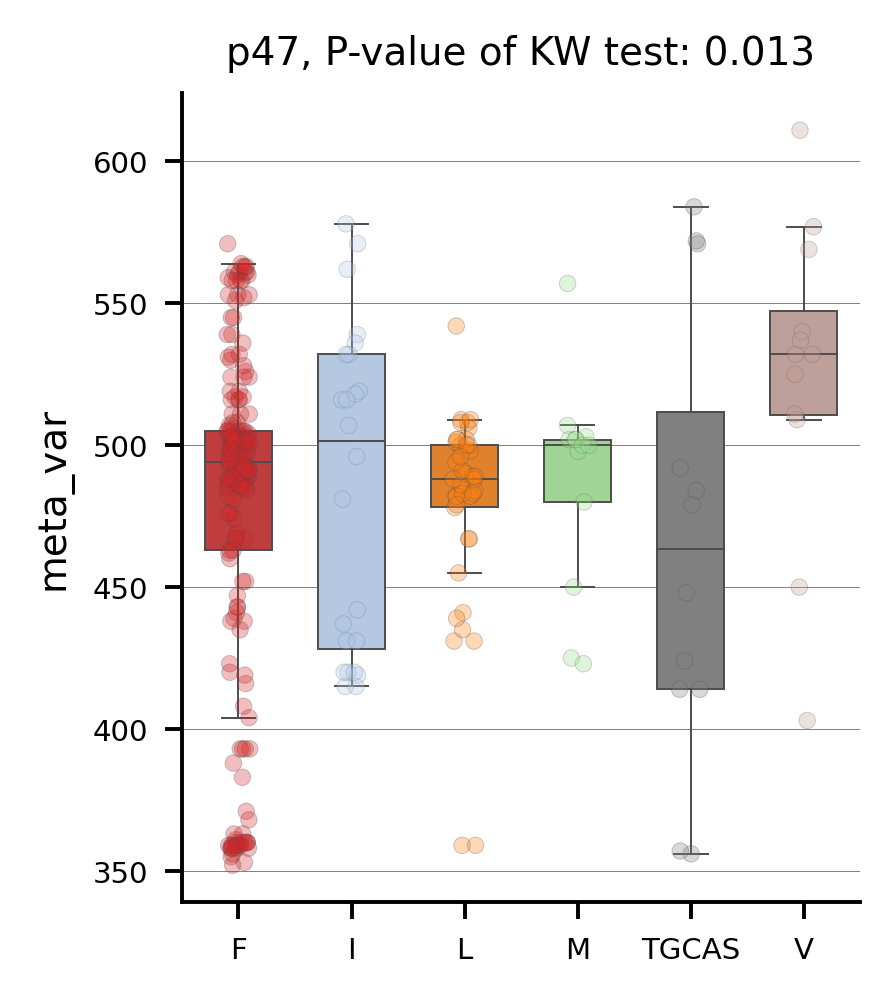

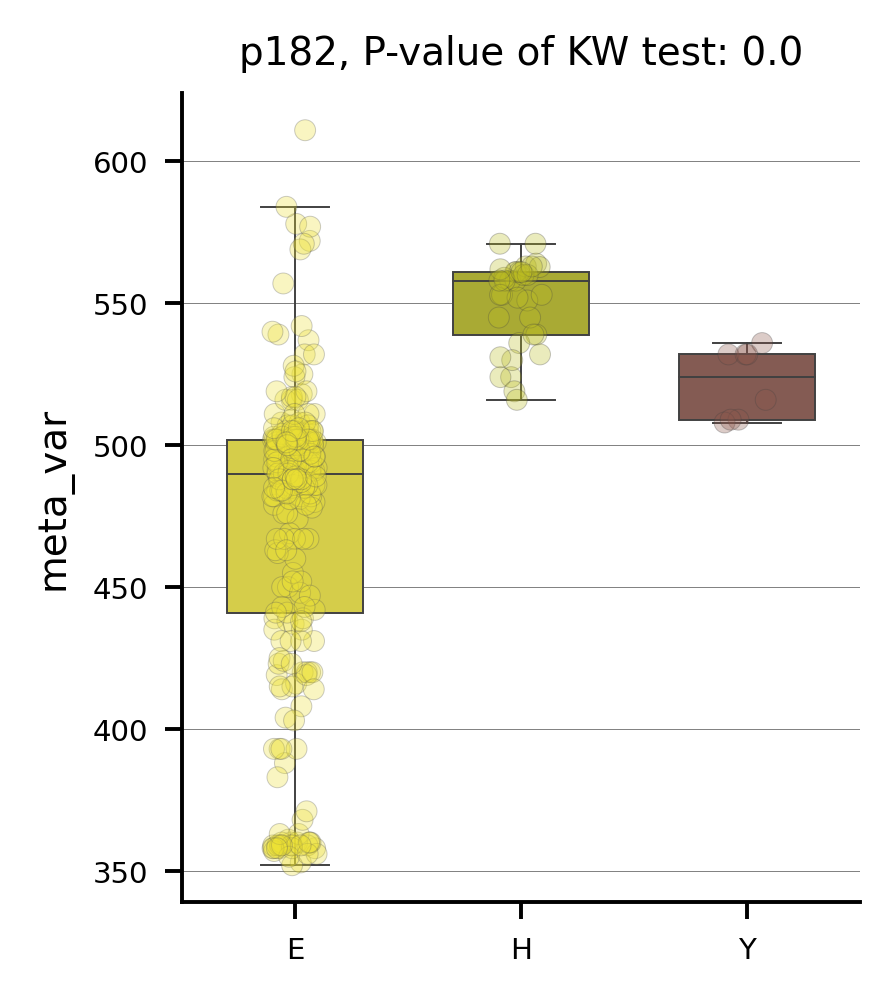

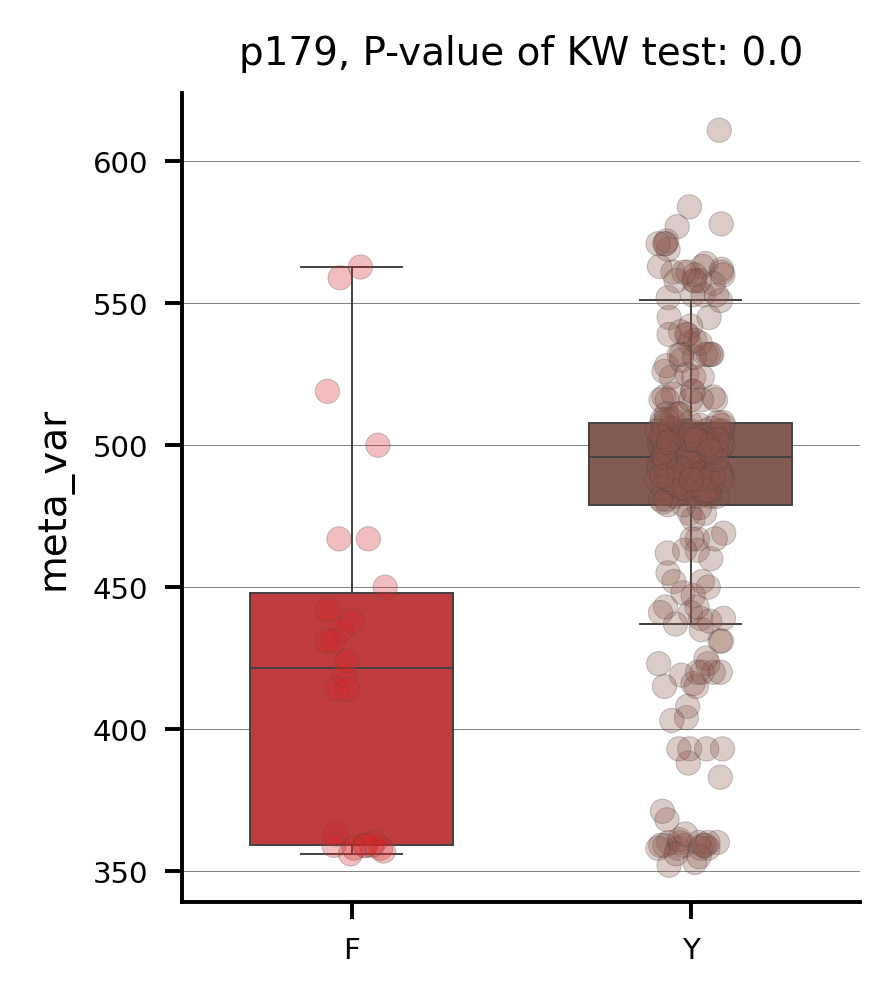

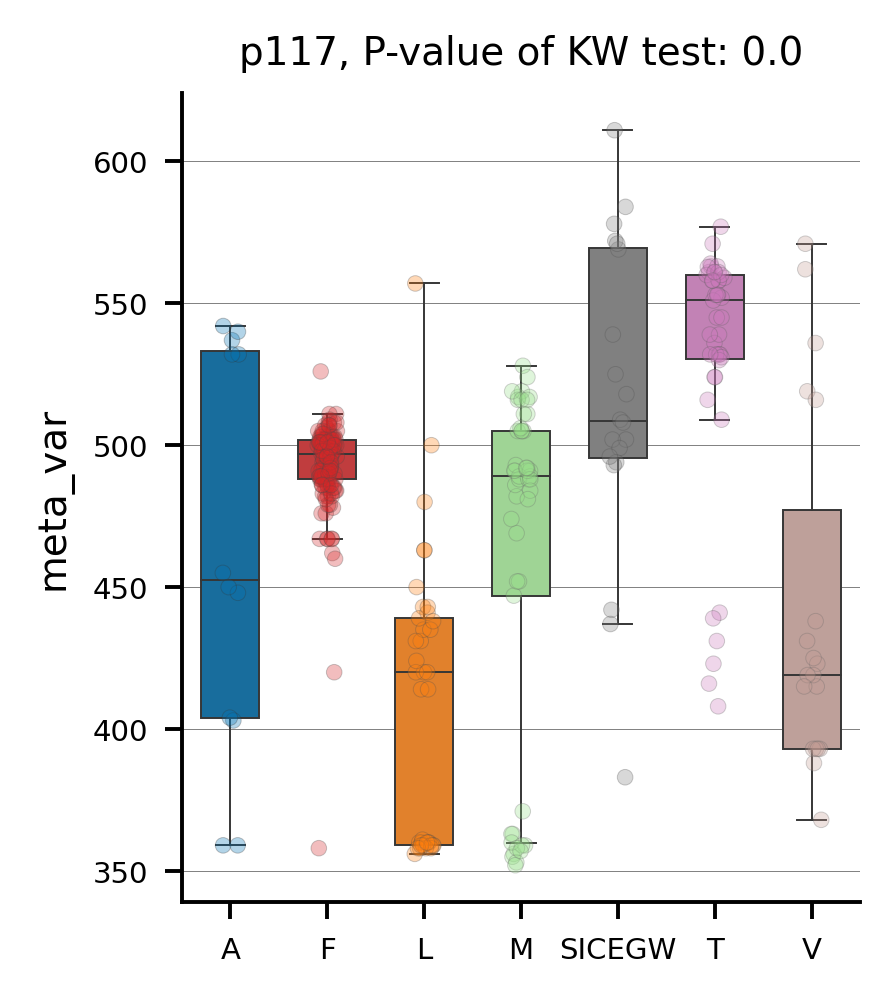

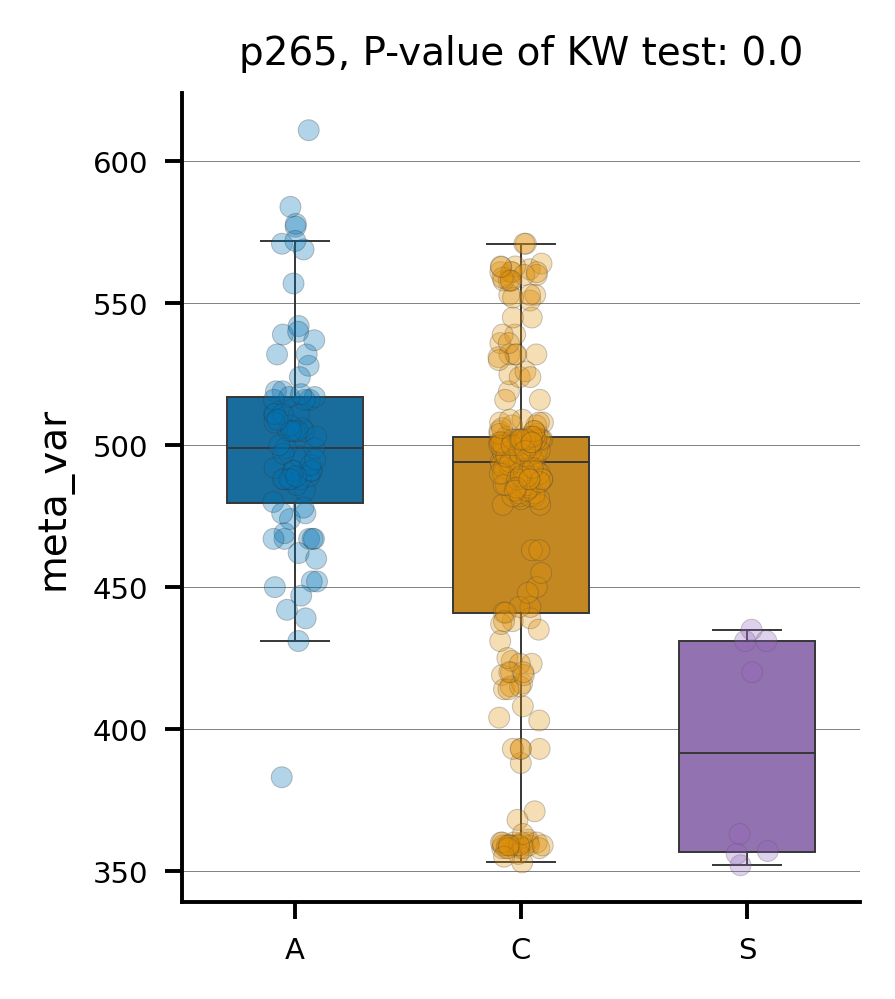

...

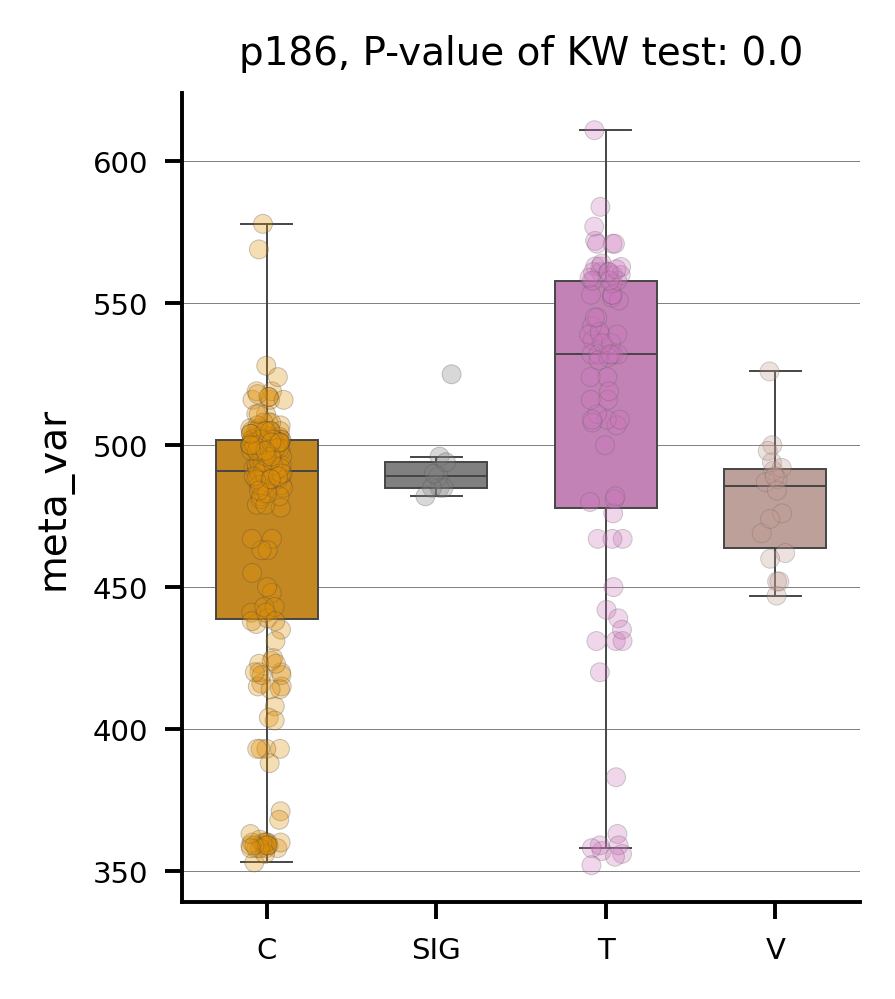

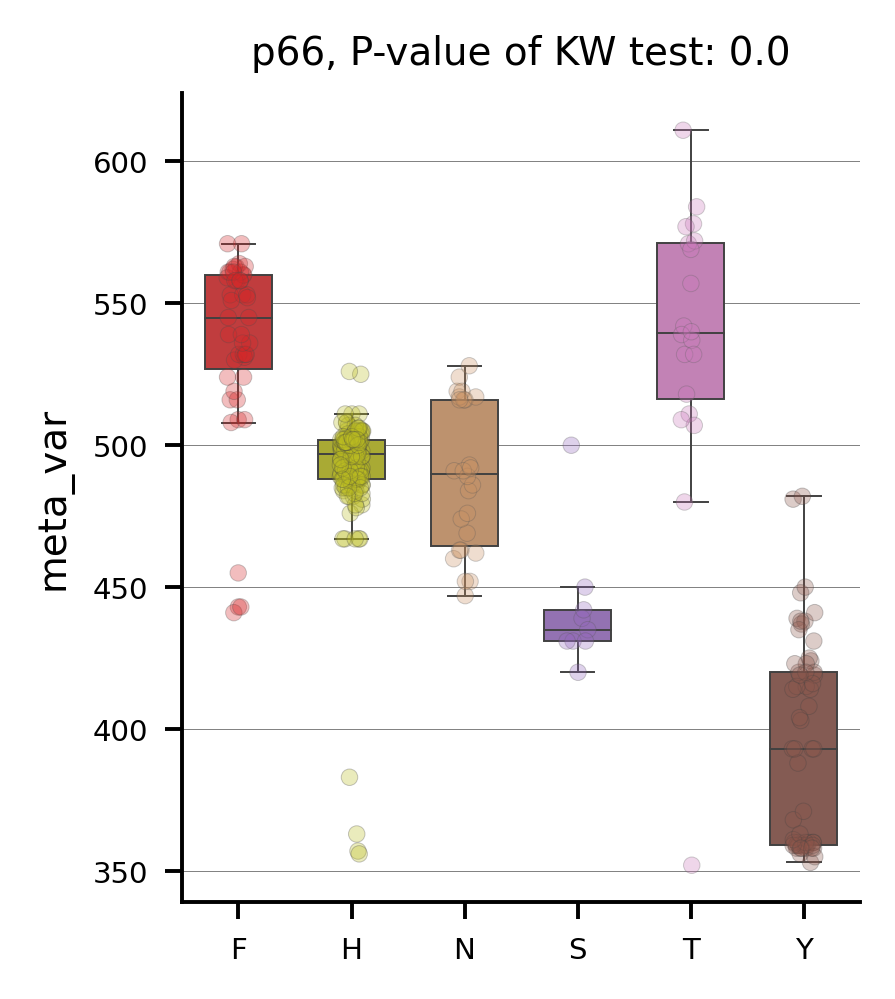

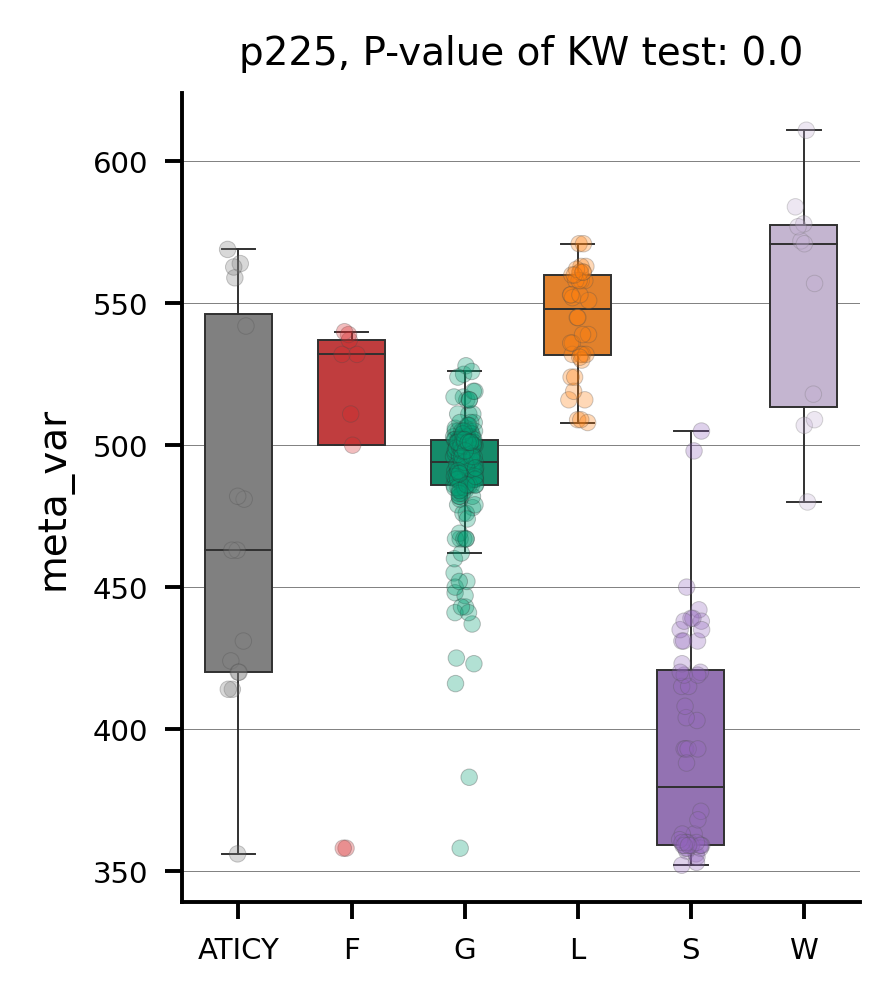

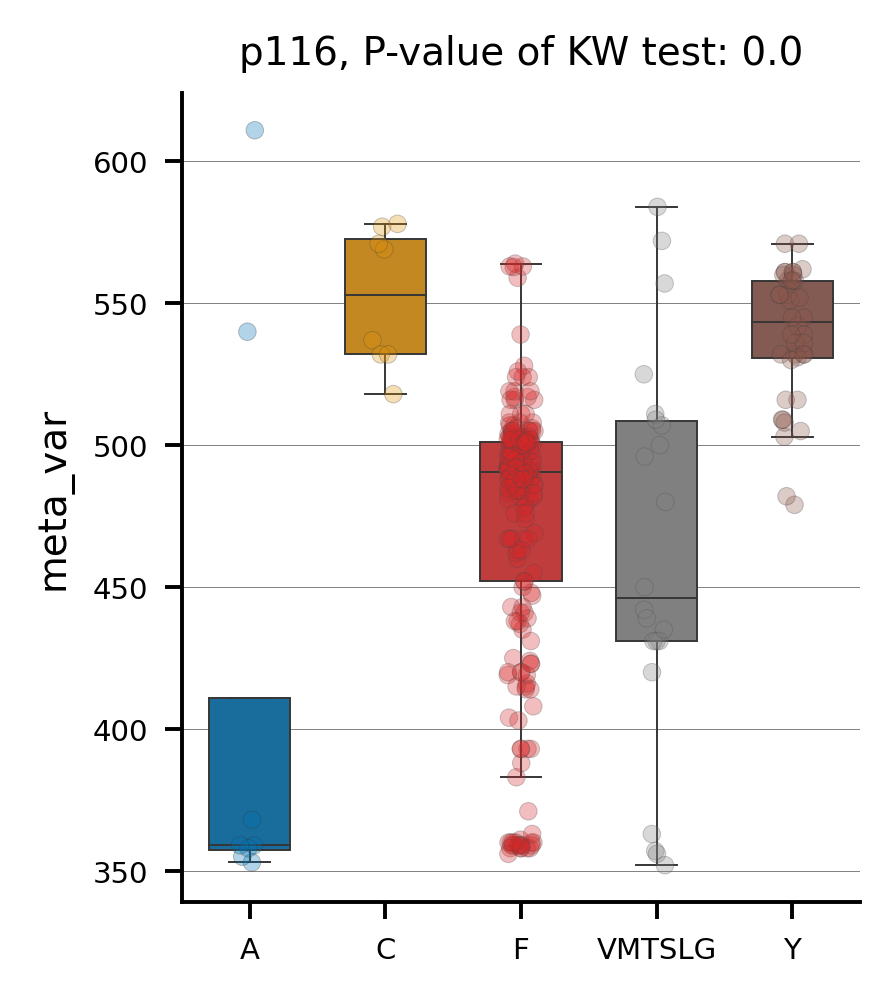

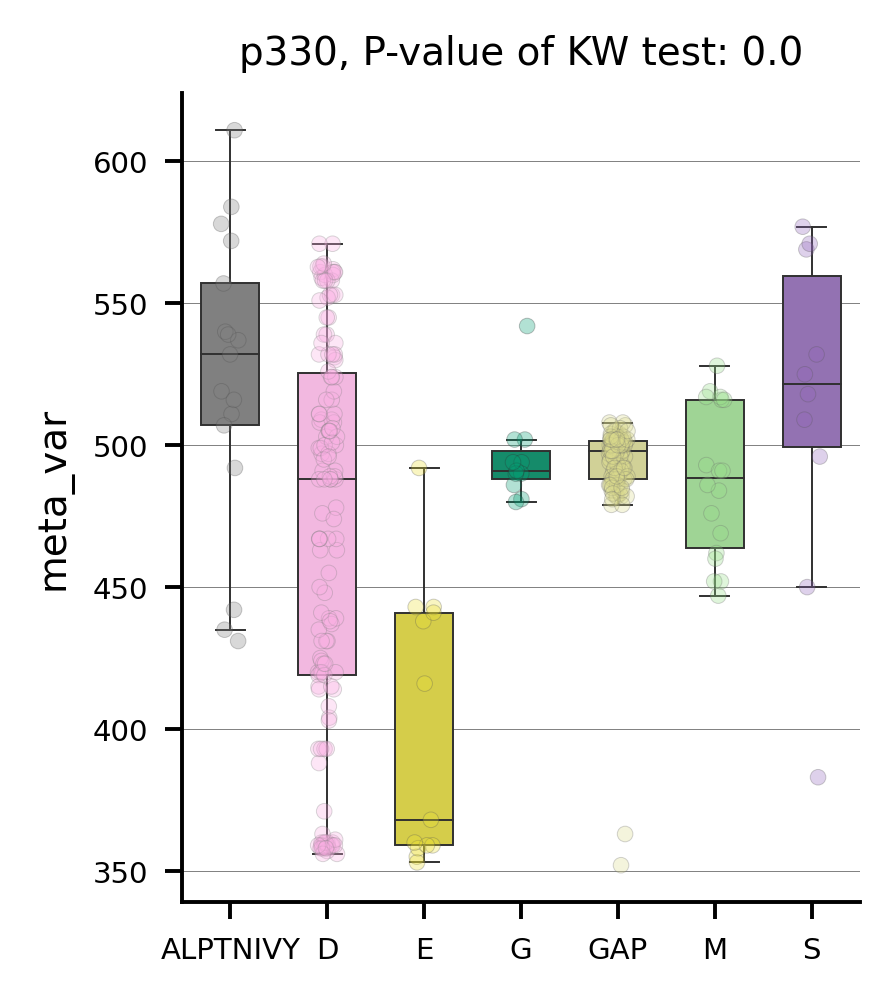

In [39]:
pl = plot_imp_all(final_models=top,
                  X_train=tr, y_train=y,
                  model_type = ana_type,
                  report_dir=report_dir, max_plots=100,
                  figsize=(2.5, 3))

In [40]:
from deepBreaks.utils import load_obj
import joblib
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error

In [58]:
top_per_mod = report_dir + '/' + mtml[0] + '.pkl'
load_top_mod = load_obj(top_per_mod)

In [59]:
print(f'Here is a list of your top performing models to test...\n{mtml}')

Here is a list of your top performing models to test...
['BayesianRidge', 'xgb', 'HubR']


[497.68159464 495.66323262 497.68159464 498.66167145 499.99904717
 498.88814058 493.19604962 492.41707131 499.99904717 499.99904717
 499.99904717 499.99904717 499.99904717 491.07969558 491.30616471
 499.99904717 499.99904717 497.88536737 508.46669331 493.19604962
 499.31326947 487.97453888 491.21196765 503.56155433 493.68657352
 500.385319   499.91469103 495.27227077 508.64183918 506.48905962
 507.90805591 508.8091047  495.15732364 508.8091047  507.90805591
 506.84956182 497.73781687 509.14186423 517.7187184  498.68499777
 505.47465006 504.78403876 511.57369105 511.57369105 504.78403876
 502.00610714 513.05662592 504.52746916 506.48905962 505.52317073
 505.52317073 505.52317073 506.84956182 484.06374999 489.38242416
 487.02498342 484.06374999 489.38242416 487.02498342 497.86468083
 486.51086886 484.06374999 489.38242416 487.02498342 500.09019775
 522.98685367 499.99904717 500.76439125 499.99904717 500.76439125
 490.08923349 502.96817765 484.29078348 493.05836396 482.8970197
 487.259913

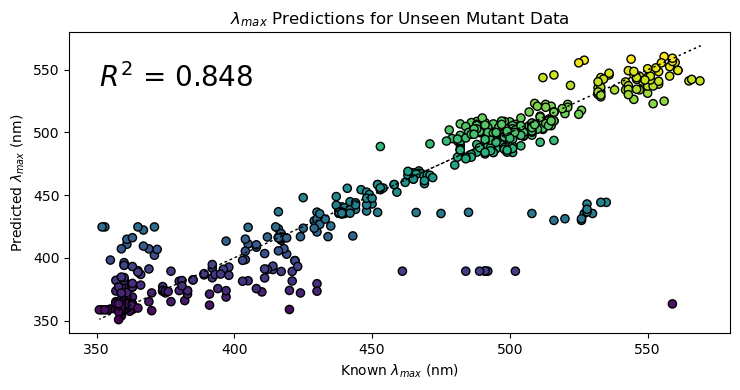

<Figure size 750x400 with 0 Axes>

0.8482936570070871
13.041757964988351
0.03051232990080003
597.9754475945848
24.45353650486131


In [72]:
try:
    predictions = load_top_mod.predict(mut)
    print(predictions)
    mut_metadata = "./vizphiz_data_splits_2023-08-09_16-39-38/mut_meta.txt"
    mut_meta = pd.read_csv(mut_metadata, sep="\t", index_col = 0)
    mut_meta = mut_meta.drop(mut_meta.index[0])
    #mut_meta.head()
    mut_meta['Prediction'] = predictions
    mut_meta['Difference'] = mut_meta['Prediction'] - mut_meta['Lambda_Max']

    mut_meta.to_csv(path_or_buf= f'{report_dir}/mut_results.csv',index = 'Feature',mode="w")
    muta_meta = mut_meta[['Species', 'Opsin_Family', 'Accession','Lambda_Max','Prediction','Difference']]

    true_lmax = mut_meta['Lambda_Max']

    mut_meta.head()
    plt.rcParams["figure.figsize"] = [7.50, 4.00]
    plt.title("$λ_{max}$ Predictions for Unseen Mutant Data")
    plt.scatter(true_lmax, predictions, c=predictions, ec = 'k', edgecolors='k', s = 35)
    plt.plot(true_lmax, true_lmax, c = 'k', linewidth = '1.0', ls = '--', dashes = (1,3))
    plt.xlabel('Known $λ_{max}$ (nm)')
    plt.ylabel('Predicted $λ_{max}$ (nm)')
    plt.annotate(f"$R^2$ = {load_top_mod.score(mut, true_lmax):.3f}",(min(true_lmax), (max(true_lmax) - ((max(true_lmax) - min(true_lmax)) *  0.15))), fontsize = 20, c = 'k')
    #plt.xticks(range(min(umd), max(umd)+1))
    fileout = f'{report_dir}/mut_test.pdf'
    plt.savefig(fileout)
    plt.show()
    plt.clf()
    plt.show()

    model_testing_report = f'{report_dir}/model_testing report.tsv'

    base_rsq = load_top_mod.score(mut, true_lmax)
    print(base_rsq)

    base_mae = mean_absolute_error(predictions,true_lmax)
    print(base_mae)

    base_mape = mean_absolute_percentage_error(predictions,true_lmax)
    print(base_mape)

    base_sqe = mean_squared_error(predictions,true_lmax)
    print(base_sqe)

    base_rsqe = mean_squared_error(predictions,true_lmax, squared = False)
    print(base_rsqe)

    with open(model_testing_report , 'w') as f:
        f.write(f'Base Model R^2\tBase Model MAE\tBase Model MAPE\tBase Model SQE\tBase Model RSQE\n')
        f.write(f'{str(base_rsq)}\t{str(base_mae)}\t{str(base_mape)}\t{str(base_sqe)}\t{str(base_rsqe)}')

except:
    print('Skipping this section - only valid for the nmoc_mut_added_aligned_db_fmt.fasta!')



In [44]:
msp_predictions = load_top_mod.predict(msp)
print(msp_predictions)

[464.49639281 423.37285773 533.93791483 422.60220842 360.83858568
 480.33254627 469.12689253 400.92365355 442.51067616 475.26126728
 523.75544941 371.40592243 428.28103898 474.63089171 560.61746976
 465.25761449 445.13178614 525.91843048 396.05307464 531.41252911
 448.89847909 386.56395591 520.69156512 529.74810548 461.10036384
 369.40023121 536.78210557 441.59296879 375.72481013 551.42359837
 477.83091399 426.30016543 456.52571071 435.30875828 450.37299356]


In [45]:
meta = "./msp_test_data/erg_msp_meta.tsv"
msp_meta = pd.read_csv(meta, sep="\t", index_col = False)
msp_meta.head()

,Species,Accession,Lambda_Max
0,Neogonodactylus_oerstedii,KJ127520.1,334
1,Neogonodactylus_oerstedii,KJ127521.1,383
2,Bombus_impatiens,XP_012237087.1,539
3,Bombus_impatiens,XP_003494923.1,424
4,Bombus_impatiens,AAV67326.1,347


In [46]:
lmax_msp = (msp_meta['Lambda_Max'])
lm = []
for i in lmax_msp:
    lm.append(float(i))


In [47]:
columns = ['Species','Accession','Lambda_Max','Predicted','Differnce']
msp_test = pd.DataFrame(index=msp.index, columns = columns)
msp_test['Predicted'] = msp_predictions
msp_test['Species'][0:31] = msp_meta['Species']
msp_test['Accession'][0:31] = msp_meta['Accession']

msp_test.head()

,Species,Accession,Lambda_Max,Predicted,Differnce
Neogonodactylus_oerstedii|334,Neogonodactylus_oerstedii,KJ127520.1,NaN,464.496393,NaN
Neogonodactylus_oerstedii|383,Neogonodactylus_oerstedii,KJ127521.1,NaN,423.372858,NaN
Bombus_impatiens|539,Bombus_impatiens,XP_012237087.1,NaN,533.937915,NaN
Bombus_impatiens|424,Bombus_impatiens,XP_003494923.1,NaN,422.602208,NaN
Bombus_impatiens|347,Bombus_impatiens,AAV67326.1,NaN,360.838586,NaN


In [48]:

msp_test['Lambda_Max'][0:31] = lm
msp_test['Differnce'] = msp_test['Predicted'] - msp_test['Lambda_Max']
msp_test.head()


,Species,Accession,Lambda_Max,Predicted,Differnce
Neogonodactylus_oerstedii|334,Neogonodactylus_oerstedii,KJ127520.1,334.0,464.496393,130.496393
Neogonodactylus_oerstedii|383,Neogonodactylus_oerstedii,KJ127521.1,383.0,423.372858,40.372858
Bombus_impatiens|539,Bombus_impatiens,XP_012237087.1,539.0,533.937915,-5.062085
Bombus_impatiens|424,Bombus_impatiens,XP_003494923.1,424.0,422.602208,-1.397792
Bombus_impatiens|347,Bombus_impatiens,AAV67326.1,347.0,360.838586,13.838586


In [49]:
msp_test.to_csv(path_or_buf= f'{report_dir}/msp_test_results.csv',index = 'Feature',mode="w")

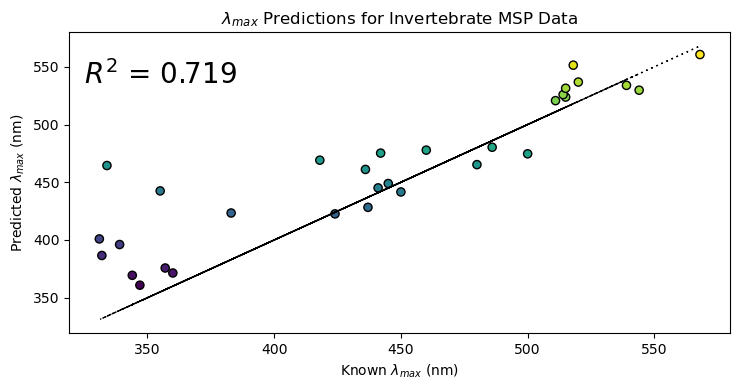

In [50]:
plt.rcParams["figure.autolayout"] = True
plt.rcParams["figure.figsize"] = [7.50, 4.00]
plt.title("$λ_{max}$ Predictions for Invertebrate MSP Data")
plt.scatter(msp_test['Lambda_Max'][0:31], msp_predictions[0:31], c=msp_predictions[0:31], ec = 'k', edgecolors='k', s = 35)
plt.plot(msp_test['Lambda_Max'][0:31], msp_test['Lambda_Max'][0:31], c = 'k', linewidth = '1.0', ls = '--', dashes = (1,3))
plt.xlabel('Known $λ_{max}$ (nm)')
plt.ylabel('Predicted $λ_{max}$ (nm)')
plt.annotate(f"$R^2$ = {load_top_mod.score(msp[0:31], msp_test['Lambda_Max'][0:31]):.3f}",(325, 535), fontsize = 20, c = 'k')
fileout = f'{report_dir}/msp_dp.pdf'
plt.savefig(fileout)
plt.show()

In [51]:
model_testing_report = f'{report_dir}/model_testing report.tsv'

msp_rsq = load_top_mod.score(msp[0:31], msp_test['Lambda_Max'][0:31])
#print(msp_rsq)
msp_mae = mean_absolute_error(msp_test['Predicted'][0:31], msp_test['Lambda_Max'][0:31])
#print(msp_mae)
msp_mape = mean_absolute_percentage_error(msp_test['Predicted'][0:31], msp_test['Lambda_Max'][0:31])
#print(msp_mape)
msp_sqe = mean_squared_error(msp_test['Predicted'][0:31], msp_test['Lambda_Max'][0:31])
#print(msp_sqe)
msp_rsqe = mean_squared_error(msp_test['Predicted'][0:31], msp_test['Lambda_Max'][0:31], squared = False)
#print(msp_rsqe)
with open(model_testing_report , 'a') as f:
    f.write(f'\nMSP Model Test R^2\tMAE\tMAPE\tSQE\tRSQE\n')
    f.write(f'{str(msp_rsq)}\t{str(msp_mae)}\t{str(msp_mape)}\t{str(msp_sqe)}\t{str(msp_rsqe)}')


# <font color=red>STEP 4: Translate Candidate STSs</font> 
## Optional step IF running the classifier model, but could still be useful.
### To find CSTSs, got to the deepBreaks output folder and find the excel sheet 'avg_top_models_feature_importance'
### Sort the top model's feature importance column by 'largest-to-smallest' and take x# of those positions.

In [52]:
import pandas as pd
import os

In [53]:
#STEP 4: Translate Candidate STSs 
#Optional step IF running the classifier model, but could still be useful.
#To find CSTSs, got to the deepBreaks output folder and find the excel sheet 'avg_top_models_feature_importance'
#Sort the top model's feature importance column by 'largest-to-smallest' and take x# of those positions.
m = 0
tm = ''
k=0
gaps=0
#import importance_report.csv from report_dir
true_pos = []
aa = []
tmd = []

df = pd.read_csv(f'{report_dir}\importance_report.csv')

#take the list of important sites and translate them to the bovine standard equivalent, we do this by taking the site number and subtracting the number of '-' between the start of the sequence and the desired site. 
for rows in reference_seq.values:  
    rows = str(rows)
    #print(rows)
    if rows == 'nan':
    #We want to write the 'true_pos', 'aa', and 'TMD' to the 'importance_report' csv file
        gaps += 1
        k += 1
        true_pos.append('NA')
        aa.append('-')
        tmd.append('NA')
    else:
        #print("The number of gaps is " + str(gaps))
        k+=1
        trans_site = k - gaps

        if trans_site in range(39,66):
            tm = '1'
        elif trans_site in range(3,38):
            tm = 'N-Termina'
        elif trans_site in range(72,100):
            tm = '2'
        elif trans_site in range(110,141):
            tm = '3'
        elif trans_site in range(151,174):
            tm = '4'
        elif trans_site in range(200,231):
            tm = '5'
        elif trans_site in range(245,276):
            tm = '6'
        elif trans_site in range(285,311):
            tm = '7'
        else:
            tm = 'NA'
        
        true_pos.append(str(trans_site))
        aa.append(rows)
        tmd.append(tm)
true_pos.pop()
aa.pop()
tmd.pop()

df['true_position'] = true_pos
df['TMD'] = tmd
df['amino_acid'] = aa

df.to_csv(path_or_buf= os.path.join(report_dir,r'importance_report.csv'),index = 'Feature',mode="w")
df.head()


,feature,BayesianRidge,xgb,HubR,mean,true_position,TMD,amino_acid
0,1,0.175643,0.000287,0.113023,0.096317,1,NA,M
1,2,0.370281,0.000350,0.290129,0.220253,2,NA,N
2,3,0.160503,0.000022,0.309819,0.156781,3,N-Termina,G
3,4,0.183295,0.000028,0.303591,0.162305,4,N-Termina,T
4,5,0.208212,0.000012,0.214147,0.140791,5,N-Termina,E


# <font color=red>STEP 5: Query the Model to Predict NEW Sequences</font> 
## Takes new sequences, inserts them into existing alignment to properly format for model query, then returns prediction of the λmax value for each sequence...

In [56]:
import os
import subprocess

i = 0
#path to the mafft.bat file
mafft_exe = 'C:/Users/safra/mafft-win/mafft.bat'
#path to sequences we want to add to an existing alignment [the one we used to train the model] in FASTA format
seq_add = 'mutant_seqs.fasta'
#path to the primary alignment used for training the model - if trying access a specific file later
#seqFileName = './vizphiz_data_splits_2023-08-09_16-39-38/nmoc_mut_added_aligned_db_fmt.fasta' 
# path to the corresponding metadata file
#metaDataFileName = './vizphiz_data_splits_2023-08-09_16-39-38/nmoc_meta.tsv' 
#path to the top performing model from model training
#can use method below or enter path manually if coming back to notebook with no variables intialized
top_per_mod = report_dir + '/' + mtml[0] + '.pkl'
load_top_mod = load_obj(top_per_mod)

mut_ali = seqFileName[2:].split("/")[1]
mut_ali = f'{mut_ali.split(".")[0]}_mutant_aligned.fasta'
print(mut_ali)
cmd = [mafft_exe, '--add', seq_add, '--keeplength', seqFileName , '>', f'{report_dir}/{mut_ali}' ]
aligner = subprocess.Popen(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
out_put = aligner.communicate()[0].decode('utf8')

#print(out_put)
mut_test = read_data( f'./{report_dir}/{mut_ali}', seq_type = seq_type, is_main=True, gap_threshold=0.6)
ref_copy = read_data( seqFileName, seq_type = seq_type, is_main=True, gap_threshold=0.6)
last_seq = ref_copy.shape[0]
#print(ref_copy.shape)
#print(last_seq)
mut_test = mut_test.iloc[last_seq:].copy()
print(mut_test)

predictions = load_top_mod.predict(mut_test)
print(predictions)
mut_fin = pd.DataFrame(index=mut_test.index)
mut_fin['Prediction'] = predictions
mut_fin.to_csv(path_or_buf= f'{report_dir}/new_mutant_predictions.csv',mode="w")
  

nmoc_mut_added_aligned_db_fmt_mutant_aligned.fasta
                                                p1 p2 p3 p4 p5 p6 p7 p8 p9  \
NM_001014890_N151S                               M  N  G  T  E  G  P  N  F   
NM_001014890_F228L                               M  N  G  T  E  G  P  N  F   
NM_001014890_F287L                               M  N  G  T  E  G  P  N  F   
NM_001014890_A132S                               M  N  G  T  E  G  P  N  F   
NM_001014890_G174D                               M  N  G  T  E  G  P  N  F   
NM_001014890_P180R                               M  N  G  T  E  G  P  N  F   
NM_001014890_V162F                               M  N  G  T  E  G  P  N  F   
NM_001014890_S298A                               M  N  G  T  E  G  P  N  F   
NM_001014890_E181H                               M  N  G  T  E  G  P  N  F   
NM_001014890_D190I                               M  N  G  T  E  G  P  N  F   
NM_001014890_Y30Q                                M  N  G  T  E  G  P  N  F   
NM_001014890_